# 2181532 - Atlast Khorommbi Ganyane (NLP Project 2022)

# Import the Libraries

In [1]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import nltk
import string
import re

from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer
from nltk import word_tokenize

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# The warnings genearated can be a nuisance, we'll turn them off
import warnings
warnings.filterwarnings('ignore')

# Loading the Dataset

In [2]:
train_df = pd.read_csv('train.csv') # train dataset

test_df = pd.read_csv('test.csv') # test dataset

val_df = pd.read_csv('val.csv') # validation dataset

# Explore the Data

In [3]:
train_df.head()

,text,label
0,"Subject: thank you\r\nami and daren , , , ,\r\...",0
1,"Subject: spot or firm tickets\r\nvance ,\r\nth...",0
2,Subject: software\r\nmicrosoft windows xp prof...,1
3,Subject: noms / actual flow for 2 / 27\r\nwe a...,0
4,Subject: superb so . ftware\r\nyoull discover ...,1


In [4]:
train_df.tail()

,text,label
3097,Subject: \r\n( envelope - from 20040929124340 ...,1
3098,Subject: re : intraday eastrans nomination cha...,0
3099,Subject: meter 1601\r\ndaren - meter 1601 has ...,0
3100,Subject: need legal help ?\r\nto unsubscribe f...,1
3101,"Subject: re : tuesday , december 26 th\r\nmary...",0


In [5]:
train_df.shape

(3102, 2)

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3102 entries, 0 to 3101
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    3102 non-null   object
 1   label   3102 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 48.6+ KB


### Class distribution of Label column

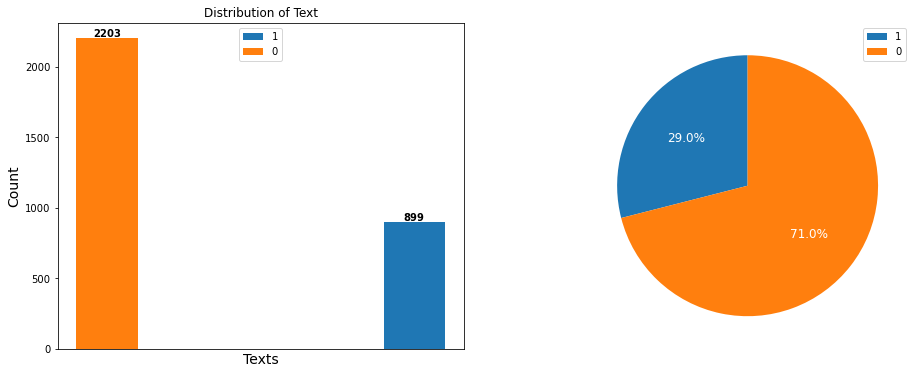

In [7]:
# define the figure and subplots
fig, axs = plt.subplots(nrows = 1, ncols = 2)
fig.set_size_inches(16, 6, forward = True)

# define the colors
colors = ['tab:blue', 'tab:orange']

# labels
labels = [1, 0]

# frequency count of labels 
values = train_df['label'].value_counts(ascending = True)
    
# bar plot
bars = axs[0].bar(labels, values, width = 0.2, color = colors)
axs[0].set_title('Distribution of Text')
axs[0].set_xlabel('Texts', fontsize = 14)
axs[0].set_ylabel('Count', fontsize = 14)
axs[0].set_xticks([])
axs[0].legend(handles = bars, labels = labels, loc = 'upper center')

# put frequency count at the top of each bar
for bar, value in zip(bars, values):
    height = bar.get_height()
    axs[0].text(bar.get_x() + bar.get_width()/2.0, height, '%.f' % float(value), ha = 'center', 
                color = 'black', va = 'bottom', fontweight = 'bold', fontsize = 10)  
    
# pie chart
axs[1].pie(values, autopct = '%1.1f%%', startangle = 90, textprops = {'color': 'white', 'fontsize': 12})
axs[1].legend(labels = labels, loc = 'best')

# display the plot
plt.show()

In [8]:
train_1 = train_df.loc[train_df['label']== 1]

train_0 = train_df.loc[train_df['label']== 0]

print(train_1.shape)
print(train_0.shape)

(899, 2)
(2203, 2)


# Preprocess the Dataset - Task 1

In [9]:
def preprocess(text):
    
    # keep only alphabet text by ignoring digits and punctuations
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # tokenization
    tokens = word_tokenize(text)
    
    # create an instance of stemming
    stemmer = PorterStemmer()
    
    # perform stemming along with stopwords removal
    #tokens = [stemmer.stem(word) for word in tokens if not word in stopwords.words('english')]
    
    # concatenate the tokens back into a single text
    #text = ' '.join(tokens)
    
    
    clean_text = []
    
    for word in tokens:
        if (word not in stopwords.words('english')):
            stem_word = stemmer.stem(word)
            clean_text.append(stem_word)
            
    return clean_text


In [10]:
train_x = []
test_x = []
val_x = []

# Apply the preprocessing method
#train_df["text"] = train_df.text.apply(preprocess)
#test_df["text"] = test_df.text.apply(preprocess)
#val_df["text"] = test_df.text.apply(preprocess)

# splitting train_df into x_train and y_train
train_data = train_df["text"]
y_train = train_df["label"]

for tr in train_data:
    train_x.append(preprocess(tr))

# splitting train_df into x_train and y_train
test_data = test_df["text"]
y_test =  test_df["label"]

for te in test_data:
    test_x.append(preprocess(te))

# splitting train_df into x_train and y_train
val_data = val_df["text"]
y_val =  val_df["label"]

for v in val_data:
    val_x.append(preprocess(v))


In [11]:
# train_x = [text for text in train_data]
train_x

[['subject',
  'thank',
  'ami',
  'daren',
  'want',
  'say',
  'thank',
  'great',
  'time',
  'st',
  'pete',
  'beach',
  'fla',
  'compani',
  'food',
  'fish',
  'ye',
  'coars',
  'drink',
  'mani',
  'drink',
  'great',
  'daren',
  'relat',
  'drink',
  'enjoy',
  'meet',
  'everyon',
  'appreci',
  'busi',
  'look',
  'forward',
  'continu',
  'busi',
  'relat',
  'enron',
  'futur',
  'sincer',
  'tim'],
 ['subject',
  'spot',
  'firm',
  'ticket',
  'vanc',
  'follow',
  'nomin',
  'deal',
  'ticket',
  'sitara',
  'septemb',
  'activ',
  'pleas',
  'advis',
  'whether',
  'deal',
  'spot',
  'firm',
  'daren',
  'want',
  'everyth',
  'sitara',
  'pm',
  'monday',
  'august',
  'thank',
  'bob',
  'sourc',
  'meter',
  'sept',
  'nom',
  'ccgm',
  'lp',
  'cross',
  'tex',
  'cummin',
  'walker',
  'unk',
  'dalla',
  'product',
  'duke',
  'energi',
  'trade',
  'eex',
  'oper',
  'eog',
  'resourc',
  'hesco',
  'gather',
  'hesco',
  'gather',
  'ph',
  'explor',
  'pio

In [12]:
def get_vocabulary(train_data):
    vocab = []
    
    for list_of_words in train_data:
        for word in list_of_words:
            if word not in vocab:
                vocab.append(word)

    return vocab

def count_word_frequency_label(texts, classes):
    
    freq_dict = {}
    
    classes_list = np.squeeze(classes).tolist()
    
    for y, text in zip(classes_list, texts):
        for word in text:
            word_label = (word, y)
            if word_label in freq_dict:
                freq_dict[word_label] += 1
                
            else:
                freq_dict[word_label] = 1

    return freq_dict

def get_word_frequency(texts):
    vocab = {}
    
    for text in texts:
        for word in text:
            if word in vocab:
                vocab[word] += 1
            else:
                vocab[word] = 1
                
    return vocab

# get vocabulary list
vocab = get_vocabulary(train_x)

    
# get frequency dictionary with word frequency
freq_dicts = count_word_frequency_label(train_x, y_train)

# # get dictionary with 10 most frequent word
# most_10 = dict(Counter(freq_dicts).most_common(10))

# # get list with 10 most frequent word
# most_ten_list = list(most_10.keys())

# for sub in train_x:
#     sub[:] = [ele for ele in sub if not ele in most_ten_list]
            
freq_dicts

{('subject', 0): 3788,
 ('thank', 0): 1247,
 ('ami', 0): 247,
 ('daren', 0): 1120,
 ('want', 0): 341,
 ('say', 0): 66,
 ('great', 0): 77,
 ('time', 0): 415,
 ('st', 0): 94,
 ('pete', 0): 6,
 ('beach', 0): 12,
 ('fla', 0): 1,
 ('compani', 0): 350,
 ('food', 0): 2,
 ('fish', 0): 3,
 ('ye', 0): 31,
 ('coars', 0): 1,
 ('drink', 0): 5,
 ('mani', 0): 64,
 ('relat', 0): 75,
 ('enjoy', 0): 33,
 ('meet', 0): 210,
 ('everyon', 0): 68,
 ('appreci', 0): 71,
 ('busi', 0): 249,
 ('look', 0): 286,
 ('forward', 0): 958,
 ('continu', 0): 171,
 ('enron', 0): 3908,
 ('futur', 0): 59,
 ('sincer', 0): 17,
 ('tim', 0): 21,
 ('spot', 0): 135,
 ('firm', 0): 89,
 ('ticket', 0): 498,
 ('vanc', 0): 248,
 ('follow', 0): 495,
 ('nomin', 0): 627,
 ('deal', 0): 2141,
 ('sitara', 0): 490,
 ('septemb', 0): 164,
 ('activ', 0): 240,
 ('pleas', 0): 1612,
 ('advis', 0): 105,
 ('whether', 0): 33,
 ('everyth', 0): 48,
 ('pm', 0): 1319,
 ('monday', 0): 139,
 ('august', 0): 190,
 ('bob', 0): 385,
 ('sourc', 0): 20,
 ('meter',

# Feature Extraction using CountVectorized from scratch

In [13]:

# Bag of Words method/function (CounterVectorizer)
def CountVec(x, v):
    sent_vec = []
    for token in v:
        if token in x:
            sent_vec.append(x.count(token))
        else:
            sent_vec.append(0)
        
    return sent_vec


x_train = []
x_test = []
x_val = []

for i in train_x:
    x_train.append(CountVec(i,vocab))
    
for j in test_x:
    x_test.append(CountVec(j,vocab))
    
for k in val_x:
    x_val.append(CountVec(k,vocab))

# Numpy
x_train = np.array(x_train)
x_test = np.array(x_test)
x_val = np.array(x_val)

x_train

array([[1, 2, 1, ..., 0, 0, 0],
       [1, 1, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 0],
       ...,
       [1, 1, 0, ..., 0, 0, 0],
       [1, 0, 0, ..., 0, 0, 1],
       [2, 1, 0, ..., 0, 0, 0]])

In [14]:
print(train_x)

[['subject', 'thank', 'ami', 'daren', 'want', 'say', 'thank', 'great', 'time', 'st', 'pete', 'beach', 'fla', 'compani', 'food', 'fish', 'ye', 'coars', 'drink', 'mani', 'drink', 'great', 'daren', 'relat', 'drink', 'enjoy', 'meet', 'everyon', 'appreci', 'busi', 'look', 'forward', 'continu', 'busi', 'relat', 'enron', 'futur', 'sincer', 'tim'], ['subject', 'spot', 'firm', 'ticket', 'vanc', 'follow', 'nomin', 'deal', 'ticket', 'sitara', 'septemb', 'activ', 'pleas', 'advis', 'whether', 'deal', 'spot', 'firm', 'daren', 'want', 'everyth', 'sitara', 'pm', 'monday', 'august', 'thank', 'bob', 'sourc', 'meter', 'sept', 'nom', 'ccgm', 'lp', 'cross', 'tex', 'cummin', 'walker', 'unk', 'dalla', 'product', 'duke', 'energi', 'trade', 'eex', 'oper', 'eog', 'resourc', 'hesco', 'gather', 'hesco', 'gather', 'ph', 'explor', 'pioneer', 'explor', 'pure', 'resourc', 'rio', 'vista', 'samson', 'lonestar', 'swift', 'energi', 'tema', 'oil', 'ga', 'tri', 'union', 'develop', 'white', 'petroleum'], ['subject', 'softwa

In [15]:
print(vocab)

['subject', 'thank', 'ami', 'daren', 'want', 'say', 'great', 'time', 'st', 'pete', 'beach', 'fla', 'compani', 'food', 'fish', 'ye', 'coars', 'drink', 'mani', 'relat', 'enjoy', 'meet', 'everyon', 'appreci', 'busi', 'look', 'forward', 'continu', 'enron', 'futur', 'sincer', 'tim', 'spot', 'firm', 'ticket', 'vanc', 'follow', 'nomin', 'deal', 'sitara', 'septemb', 'activ', 'pleas', 'advis', 'whether', 'everyth', 'pm', 'monday', 'august', 'bob', 'sourc', 'meter', 'sept', 'nom', 'ccgm', 'lp', 'cross', 'tex', 'cummin', 'walker', 'unk', 'dalla', 'product', 'duke', 'energi', 'trade', 'eex', 'oper', 'eog', 'resourc', 'hesco', 'gather', 'ph', 'explor', 'pioneer', 'pure', 'rio', 'vista', 'samson', 'lonestar', 'swift', 'tema', 'oil', 'ga', 'tri', 'union', 'develop', 'white', 'petroleum', 'softwar', 'microsoft', 'window', 'xp', 'professiozn', 'retail', 'price', 'low', 'prici', 'save', 'adob', 'photoshkop', 'savu', 'offic', 'profession', 'savx', 'illustr', 'retaitl', 'corel', 'draw', 'graphic', 'suit',

In [16]:
print("The length of vocabulary |V|:",len(vocab))
#print(x_train)
print(len(x_train),len(x_train[0]))
print("The shape of vectorized x_train:", x_train.shape)
print("The shape of vectorized x_test:", x_test.shape)
print("The shape of vectorized x_val:", x_val.shape)


The length of vocabulary |V|: 28549
3102 28549
The shape of vectorized x_train: (3102, 28549)
The shape of vectorized x_test: (1034, 28549)
The shape of vectorized x_val: (1035, 28549)


# Train and Evaluate the Models

## Standard Naive Bayes (Model 1 - Task 2)

In [17]:
# Naive Bayes class
class Naive_Bayes(object):
    
    # initialize object state
    def __init__(self, alpha = 1.0):
        
        self.prior = None
        self.word_counts = None
        self.lk_word = None
        self.alpha = alpha
        self.is_fitted = False
    
    # method to fit naive bayes on train data    
    def fit(self, X, y):
        
        n = X.shape[0]

        # each class sub array
        X_by_class = np.array([X[y == c] for c in np.unique(y)])
        
        # prior probabilities of each class
        self.prior = np.array([len(X_class) / n for X_class in X_by_class])
        
        # each sub array word counts
        self.word_counts = np.array([X_class.sum(axis = 0) for X_class in X_by_class]) + self.alpha
        
        # word counts divided by the total number of times all words appear in each class
        self.lk_word = self.word_counts / self.word_counts.sum(axis = 1).reshape(-1, 1)

        # set is_fitted to true
        self.is_fitted = True
        
        return self        
        
    # method to predict naive bayes probabilities on test data 
    def predict_proba(self, X):
        
        # raise assertion-error if model is not fitted, it must be fit before predicting
        assert self.is_fitted
        
        class_numerators = np.zeros(shape = (X.shape[0], self.prior.shape[0]))
        
        # loop over each observation to calculate conditional probabilities
        for i, x in enumerate(X):
            
            word_exists = x.astype(bool)
            lk_words_present = self.lk_word[:, word_exists] ** x[word_exists]
            lk_news = (lk_words_present).prod(axis = 1)
            class_numerators[i] = lk_news * self.prior
        
        # likelihood of 'News' across all classes
        normalize_term = class_numerators.sum(axis = 1).reshape(-1, 1)
        conditional_probas = class_numerators / normalize_term
        
        return conditional_probas    
        
    
    # method to predict class with highest probability
    def predict(self, X):
        return self.predict_proba(X).argmax(axis = 1)

#### Evaluation of Model 1 using Test data

In [18]:
from sklearn.naive_bayes import MultinomialNB

# initialize the standard Naive Bayes instance
model1 = Naive_Bayes(alpha = 1.0)
model1.fit(x_train, y_train)

y_pred = model1.predict(x_test)

from sklearn import metrics
print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred)*100)
print("Gaussian Naive Bayes model f1 score(in %):", metrics.f1_score(y_test, y_pred)*100)
print("Gaussian Naive Bayes model precision(in %):", metrics.precision_score(y_test, y_pred)*100)
print("Gaussian Naive Bayes model recall(in %):", metrics.recall_score(y_test, y_pred)*100)

# conf_m

Gaussian Naive Bayes model accuracy(in %): 88.10444874274661
Gaussian Naive Bayes model f1 score(in %): 74.53416149068323
Gaussian Naive Bayes model precision(in %): 98.36065573770492
Gaussian Naive Bayes model recall(in %): 60.0


Confusion Matrix using test data

In [19]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

cm

array([[731,   3],
       [120, 180]], dtype=int64)

#### Evaluation of Model 1 using Val data

In [20]:
y_pred = model1.predict(x_val) 

print("Gaussian Naive Bayes model accuracy val data (in %):", metrics.accuracy_score(y_val, y_pred)*100)
print("Gaussian Naive Bayes model f1 score val data (in %):", metrics.f1_score(y_val, y_pred)*100)
print("Gaussian Naive Bayes model precision val data (in %):", metrics.precision_score(y_val, y_pred)*100)
print("Gaussian Naive Bayes model recall val data (in %):", metrics.recall_score(y_val, y_pred)*100)

Gaussian Naive Bayes model accuracy val data (in %): 88.88888888888889
Gaussian Naive Bayes model f1 score val data (in %): 76.67342799188641
Gaussian Naive Bayes model precision val data (in %): 97.92746113989638
Gaussian Naive Bayes model recall val data (in %): 63.0


Confusion Matrix using val data

In [21]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_val, y_pred)

cm

array([[731,   4],
       [111, 189]], dtype=int64)

## 

## 10 Most frequent words as features (Model 2 - Task 3a)

In [22]:
from collections import Counter

word_freq_dicts = get_word_frequency(train_x)

# get dictionary with 10 most frequent word
most_10_dict = dict(Counter(word_freq_dicts).most_common(10))

# get list with 10 most frequent word
most_ten_list = list(most_10_dict.keys())

most_10_dict

{'ect': 8343,
 'subject': 4776,
 'hou': 4376,
 'enron': 3908,
 'com': 2452,
 'deal': 2200,
 'pleas': 1891,
 'ga': 1794,
 'meter': 1569,
 'hpl': 1404}

In [23]:
def most_N_as_features(text, N_feature):
    sentence_vectors = []
    for sentence in text:
        sent_vec = []
        for token in N_feature:
            if token in sentence:
                sent_vec.append(sentence.count(token))
            else:
                sent_vec.append(0)
        sentence_vectors.append(sent_vec)
        
    return sentence_vectors

mostTen_vec_train_x = np.array(most_N_as_features(train_x, most_ten_list))
mostTen_vec_test_x = np.array(most_N_as_features(test_x, most_ten_list))
mostTen_vec_val_x = np.array(most_N_as_features(val_x, most_ten_list))

In [24]:
print(most_ten_list)


['ect', 'subject', 'hou', 'enron', 'com', 'deal', 'pleas', 'ga', 'meter', 'hpl']


In [25]:
print(train_x)


[['subject', 'thank', 'ami', 'daren', 'want', 'say', 'thank', 'great', 'time', 'st', 'pete', 'beach', 'fla', 'compani', 'food', 'fish', 'ye', 'coars', 'drink', 'mani', 'drink', 'great', 'daren', 'relat', 'drink', 'enjoy', 'meet', 'everyon', 'appreci', 'busi', 'look', 'forward', 'continu', 'busi', 'relat', 'enron', 'futur', 'sincer', 'tim'], ['subject', 'spot', 'firm', 'ticket', 'vanc', 'follow', 'nomin', 'deal', 'ticket', 'sitara', 'septemb', 'activ', 'pleas', 'advis', 'whether', 'deal', 'spot', 'firm', 'daren', 'want', 'everyth', 'sitara', 'pm', 'monday', 'august', 'thank', 'bob', 'sourc', 'meter', 'sept', 'nom', 'ccgm', 'lp', 'cross', 'tex', 'cummin', 'walker', 'unk', 'dalla', 'product', 'duke', 'energi', 'trade', 'eex', 'oper', 'eog', 'resourc', 'hesco', 'gather', 'hesco', 'gather', 'ph', 'explor', 'pioneer', 'explor', 'pure', 'resourc', 'rio', 'vista', 'samson', 'lonestar', 'swift', 'energi', 'tema', 'oil', 'ga', 'tri', 'union', 'develop', 'white', 'petroleum'], ['subject', 'softwa

In [26]:
print(mostTen_vec_train_x)

[[ 0  1  0 ...  0  0  0]
 [ 0  1  0 ...  1  1  0]
 [ 0  1  0 ...  0  0  0]
 ...
 [ 0  1  0 ...  0  2  0]
 [ 0  1  0 ...  0  0  0]
 [16  2  8 ...  0  0  3]]


#### Evaluation of Model 2 using Test data

In [27]:
# model2 = MultinomialNB()
model2 = Naive_Bayes(alpha = 1.0)

model2.fit(mostTen_vec_train_x, y_train)

y_pred_m2 = model2.predict(mostTen_vec_test_x)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred_m2)*100)
print("Gaussian Naive Bayes model f1 score(in %):", metrics.f1_score(y_test, y_pred_m2)*100)
print("Gaussian Naive Bayes model precision(in %):", metrics.precision_score(y_test, y_pred_m2)*100)
print("Gaussian Naive Bayes model recall(in %):", metrics.recall_score(y_test, y_pred_m2)*100)


Gaussian Naive Bayes model accuracy(in %): 80.56092843326887
Gaussian Naive Bayes model f1 score(in %): 74.13127413127413
Gaussian Naive Bayes model precision(in %): 60.37735849056604
Gaussian Naive Bayes model recall(in %): 96.0


Confusion Matrix using test data

In [28]:
cm = confusion_matrix(y_test, y_pred_m2)

cm

array([[545, 189],
       [ 12, 288]], dtype=int64)

#### Evaluation of Model 2 using val data

In [29]:
y_pred_m2 = model2.predict(mostTen_vec_val_x)

print("Gaussian Naive Bayes model accuracy val data (in %):", metrics.accuracy_score(y_val, y_pred_m2)*100)
print("Gaussian Naive Bayes model f1 score val data (in %):", metrics.f1_score(y_val, y_pred_m2)*100)
print("Gaussian Naive Bayes model precision val data (in %):", metrics.precision_score(y_val, y_pred_m2)*100)
print("Gaussian Naive Bayes model recall val data (in %):", metrics.recall_score(y_val, y_pred_m2)*100)

Gaussian Naive Bayes model accuracy val data (in %): 79.90338164251207
Gaussian Naive Bayes model f1 score val data (in %): 73.53689567430024
Gaussian Naive Bayes model precision val data (in %): 59.465020576131685
Gaussian Naive Bayes model recall val data (in %): 96.33333333333334


Confusion Matrix using val data

In [30]:
cm = confusion_matrix(y_val, y_pred_m2)

cm

array([[538, 197],
       [ 11, 289]], dtype=int64)

## 100 Most frequent words as features (Model 3 -  Task 3b)

In [31]:
# get dictionary with 10 most frequent word
most_100_dict = dict(Counter(word_freq_dicts).most_common(100))

# get list with 10 most frequent word
most_100_list = list(most_100_dict.keys())

most_100_dict

{'ect': 8343,
 'subject': 4776,
 'hou': 4376,
 'enron': 3908,
 'com': 2452,
 'deal': 2200,
 'pleas': 1891,
 'ga': 1794,
 'meter': 1569,
 'hpl': 1404,
 'cc': 1392,
 'thank': 1348,
 'pm': 1331,
 'need': 1249,
 'e': 1198,
 'daren': 1120,
 'forward': 1091,
 'price': 1085,
 'volum': 1040,
 'corp': 1028,
 'know': 976,
 'day': 950,
 'new': 898,
 'get': 892,
 'compani': 873,
 'j': 813,
 'may': 806,
 'mmbtu': 802,
 'product': 800,
 'chang': 788,
 'see': 771,
 'http': 756,
 'contract': 751,
 'inform': 737,
 'attach': 713,
 'let': 692,
 'nom': 676,
 'time': 673,
 'farmer': 665,
 'xl': 658,
 'l': 656,
 'month': 653,
 'would': 641,
 'sale': 639,
 'nomin': 632,
 'messag': 618,
 'mail': 607,
 'one': 603,
 'th': 596,
 'call': 578,
 'flow': 572,
 'juli': 571,
 'follow': 563,
 'use': 561,
 'us': 557,
 'robert': 556,
 'question': 551,
 'ticket': 516,
 'email': 516,
 'file': 515,
 'net': 515,
 'report': 503,
 'want': 500,
 'look': 499,
 'p': 499,
 'sitara': 490,
 'manag': 489,
 'work': 486,
 'texa': 481,


In [32]:
# def most_hundred_as_features(text):
#     sentence_vectors = []
#     for sentence in text:
#         sent_vec = []
#         for token in most_100_list:
#             if token in sentence:
#                 sent_vec.append(sentence.count(token))
#             else:
#                 sent_vec.append(0)
#         sentence_vectors.append(sent_vec)
        
#     return sentence_vectors

most100_vec_train_x = np.array(most_N_as_features(train_x, most_100_list))
most100_vec_test_x = np.array(most_N_as_features(test_x, most_100_list))
most100_vec_val_x = np.array(most_N_as_features(val_x, most_100_list))

print(most_100_list)

['ect', 'subject', 'hou', 'enron', 'com', 'deal', 'pleas', 'ga', 'meter', 'hpl', 'cc', 'thank', 'pm', 'need', 'e', 'daren', 'forward', 'price', 'volum', 'corp', 'know', 'day', 'new', 'get', 'compani', 'j', 'may', 'mmbtu', 'product', 'chang', 'see', 'http', 'contract', 'inform', 'attach', 'let', 'nom', 'time', 'farmer', 'xl', 'l', 'month', 'would', 'sale', 'nomin', 'messag', 'mail', 'one', 'th', 'call', 'flow', 'juli', 'follow', 'use', 'us', 'robert', 'question', 'ticket', 'email', 'file', 'net', 'report', 'want', 'look', 'p', 'sitara', 'manag', 'work', 'texa', 'servic', 'list', 'ena', 'energi', 'number', 'also', 'sent', 'purchas', 'www', 'like', 'go', 'busi', 'market', 'x', 'actual', 'pec', 'origin', 'b', 'make', 'contact', 'receiv', 'system', 'bob', 'order', 'take', 'back', 'help', 'schedul', 'font', 'effect', 'account']


In [33]:
print(train_x)

[['subject', 'thank', 'ami', 'daren', 'want', 'say', 'thank', 'great', 'time', 'st', 'pete', 'beach', 'fla', 'compani', 'food', 'fish', 'ye', 'coars', 'drink', 'mani', 'drink', 'great', 'daren', 'relat', 'drink', 'enjoy', 'meet', 'everyon', 'appreci', 'busi', 'look', 'forward', 'continu', 'busi', 'relat', 'enron', 'futur', 'sincer', 'tim'], ['subject', 'spot', 'firm', 'ticket', 'vanc', 'follow', 'nomin', 'deal', 'ticket', 'sitara', 'septemb', 'activ', 'pleas', 'advis', 'whether', 'deal', 'spot', 'firm', 'daren', 'want', 'everyth', 'sitara', 'pm', 'monday', 'august', 'thank', 'bob', 'sourc', 'meter', 'sept', 'nom', 'ccgm', 'lp', 'cross', 'tex', 'cummin', 'walker', 'unk', 'dalla', 'product', 'duke', 'energi', 'trade', 'eex', 'oper', 'eog', 'resourc', 'hesco', 'gather', 'hesco', 'gather', 'ph', 'explor', 'pioneer', 'explor', 'pure', 'resourc', 'rio', 'vista', 'samson', 'lonestar', 'swift', 'energi', 'tema', 'oil', 'ga', 'tri', 'union', 'develop', 'white', 'petroleum'], ['subject', 'softwa

In [34]:
print(most100_vec_train_x)

[[ 0  1  0 ...  0  0  0]
 [ 0  1  0 ...  0  0  0]
 [ 0  1  0 ...  0  0  0]
 ...
 [ 0  1  0 ...  0  0  0]
 [ 0  1  0 ...  0  0  0]
 [16  2  8 ...  0  0  0]]


In [35]:
print(len(most100_vec_train_x),len(most100_vec_train_x[0]) )

3102 100


#### Evaluation of Model 3 using Test data

In [36]:
#model3 = MultinomialNB()
model3 = Naive_Bayes(alpha = 1.0)

model3.fit(most100_vec_train_x, y_train)

y_pred_m3 = model3.predict(most100_vec_test_x)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred_m3)*100)
print("Gaussian Naive Bayes model f1 score(in %):", metrics.f1_score(y_test, y_pred_m3)*100)
print("Gaussian Naive Bayes model precision(in %):", metrics.precision_score(y_test, y_pred_m3)*100)
print("Gaussian Naive Bayes model recall(in %):", metrics.recall_score(y_test, y_pred_m3)*100)


Gaussian Naive Bayes model accuracy(in %): 88.49129593810446
Gaussian Naive Bayes model f1 score(in %): 81.60741885625966
Gaussian Naive Bayes model precision(in %): 76.0806916426513
Gaussian Naive Bayes model recall(in %): 88.0


Confusion Matrix using test data

In [37]:
cm = confusion_matrix(y_test, y_pred_m3)

cm

array([[651,  83],
       [ 36, 264]], dtype=int64)

#### Evaluation of Model 3 using val data

In [38]:
y_pred_m3 = model3.predict(most100_vec_val_x)

print("Gaussian Naive Bayes model accuracy val data (in %):", metrics.accuracy_score(y_val, y_pred_m3)*100)
print("Gaussian Naive Bayes model f1 score val data (in %):", metrics.f1_score(y_val, y_pred_m3)*100)
print("Gaussian Naive Bayes model precision val data (in %):", metrics.precision_score(y_val, y_pred_m3)*100)
print("Gaussian Naive Bayes model recall val data (in %):", metrics.recall_score(y_val, y_pred_m3)*100)

Gaussian Naive Bayes model accuracy val data (in %): 86.28019323671498
Gaussian Naive Bayes model f1 score val data (in %): 78.0185758513932
Gaussian Naive Bayes model precision val data (in %): 72.83236994219652
Gaussian Naive Bayes model recall val data (in %): 84.0


Confusion Matrix using val data

In [39]:
cm = confusion_matrix(y_val, y_pred_m3)

cm

array([[641,  94],
       [ 48, 252]], dtype=int64)

## Remove 100 most frequent words as features (Model 4 -  Task 3c)

In [40]:
vocab_100_removed = [x for x in vocab if x not in most_100_list]

print("The size of the original vocab list:", len(vocab))
print("The size of the vocab list when 100 most frequent words removed:", len(vocab_100_removed))

The size of the original vocab list: 28549
The size of the vocab list when 100 most frequent words removed: 28449


In [41]:
x_train_removed_100 = np.array(most_N_as_features(train_x, vocab_100_removed))
x_test_removed_100 = np.array(most_N_as_features(test_x, vocab_100_removed))
x_val_removed_100 = np.array(most_N_as_features(val_x, vocab_100_removed))

In [42]:
print(x_train_removed_100)

[[1 1 2 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 0 0]]


In [43]:
# print(len(x_train_removed_100),len(x_train_removed_100[0]) )
print(x_train_removed_100.shape)

(3102, 28449)


#### Evaluation of Model 4 using Test data

In [44]:
#model4 = MultinomialNB()
model4 = Naive_Bayes(alpha = 1.0)

model4.fit(x_train_removed_100, y_train)

y_pred_m4 = model4.predict(x_test_removed_100)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred_m4)*100)
print("Gaussian Naive Bayes model f1 score(in %):", metrics.f1_score(y_test, y_pred_m4)*100)
print("Gaussian Naive Bayes model precision(in %):", metrics.precision_score(y_test, y_pred_m4)*100)
print("Gaussian Naive Bayes model recall(in %):", metrics.recall_score(y_test, y_pred_m4)*100)


Gaussian Naive Bayes model accuracy(in %): 89.07156673114119
Gaussian Naive Bayes model f1 score(in %): 77.079107505071
Gaussian Naive Bayes model precision(in %): 98.44559585492227
Gaussian Naive Bayes model recall(in %): 63.33333333333333


Confusion Matrix using test data

In [45]:
cm = confusion_matrix(y_test, y_pred_m4)

cm

array([[731,   3],
       [110, 190]], dtype=int64)

#### Evaluation of Model 4 using Val data

In [46]:
y_pred_m4 = model4.predict(x_val_removed_100)

print("Gaussian Naive Bayes model accuracy val data (in %):", metrics.accuracy_score(y_val, y_pred_m4)*100)
print("Gaussian Naive Bayes model f1 score val data (in %):", metrics.f1_score(y_val, y_pred_m4)*100)
print("Gaussian Naive Bayes model precision val data (in %):", metrics.precision_score(y_val, y_pred_m4)*100)
print("Gaussian Naive Bayes model recall val data (in %):", metrics.recall_score(y_val, y_pred_m4)*100)

Gaussian Naive Bayes model accuracy val data (in %): 89.66183574879227
Gaussian Naive Bayes model f1 score val data (in %): 78.3838383838384
Gaussian Naive Bayes model precision val data (in %): 99.48717948717949
Gaussian Naive Bayes model recall val data (in %): 64.66666666666666


Confusion Matrix using val data

In [47]:
cm = confusion_matrix(y_val, y_pred_m4)

cm

array([[734,   1],
       [106, 194]], dtype=int64)

## Subject line as feature (Model 5 - Task 3d)

In [48]:
subject_line = ['subject:']
x_train_subject = np.array(most_N_as_features(train_x, subject_line))
x_test_subject = np.array(most_N_as_features(test_x, subject_line))
x_val_subject = np.array(most_N_as_features(val_x, subject_line))
print(x_test_subject)
print(test_x[0])

[[0]
 [0]
 [0]
 ...
 [0]
 [0]
 [0]]
['subject', 'prc', 'meet', 'agenda', 'recap', 'clarifi', 'discuss', 'discuss', 'promot', 'candid', 'salli', 'prior', 'prc', 'meet', 'remind', 'prc', 'meet', 'held', 'tuesday', 'eb', 'cl', 'begin', 'noon', 'lunch', 'serv', 'yvett', 'drink', 'snack', 'throughout', 'day', 'goal', 'dinner', 'necessari', 'suggest', 'make', 'arrang', 'stay', 'late', 'need', 'ensur', 'reach', 'qualiti', 'work', 'product', 'agenda', 'review', 'ground', 'rule', 'respons', 'committe', 'provid', 'gener', 'busi', 'assess', 'team', 'hr', 'challeng', 'identifi', 'along', 'need', 'skill', 'set', 'gap', 'analysi', 'success', 'plan', 'templat', 'use', 'format', 'interest', 'discuss', 'busi', 'goal', 'probabl', 'need', 'think', 'order', 'discuss', 'assess', 'want', 'discuss', 'group', 'review', 'discuss', 'exempt', 'employe', 'categor', 'six', 'descriptor', 'use', 'feedback', 'process', 'expect', 'list', 'accomplish', 'employe', 'along', 'factual', 'feedback', 'observ', 'allow', 'plac

In [49]:
#x_train_subject = x_train_subject.reshape(-1,1)
x_train_subject.shape

(3102, 1)

#### Evaluation of Model 5 using Test data

In [50]:
model5 = Naive_Bayes(alpha = 1.0)
#from sklearn.naive_bayes import GaussianNB

#model5 = GaussianNB()
model5.fit(x_train_subject, y_train)
y_pred_m5 = model5.predict(x_test_subject)
print(y_pred_m5)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred_m5)*100)
print("Gaussian Naive Bayes model f1 score(in %):", metrics.f1_score(y_test, y_pred_m5)*100)
print("Gaussian Naive Bayes model precision(in %):", metrics.precision_score(y_test, y_pred_m5)*100)
print("Gaussian Naive Bayes model recall(in %):", metrics.recall_score(y_test, y_pred_m5)*100)

[0 0 0 ... 0 0 0]
Gaussian Naive Bayes model accuracy(in %): 70.98646034816247
Gaussian Naive Bayes model f1 score(in %): 0.0
Gaussian Naive Bayes model precision(in %): 0.0
Gaussian Naive Bayes model recall(in %): 0.0


Confusion matrix using test data

In [51]:
cm = confusion_matrix(y_test, y_pred_m5)

cm

array([[734,   0],
       [300,   0]], dtype=int64)

#### Evaluation of Model 5 using Val data

In [52]:
y_pred_m5 = model5.predict(x_val_subject)

print("Gaussian Naive Bayes model accuracy val data (in %):", metrics.accuracy_score(y_val, y_pred_m5)*100)
print("Gaussian Naive Bayes model f1 score val data (in %):", metrics.f1_score(y_val, y_pred_m5)*100)
print("Gaussian Naive Bayes model precision val data (in %):", metrics.precision_score(y_val, y_pred_m5)*100)
print("Gaussian Naive Bayes model recall val data (in %):", metrics.recall_score(y_val, y_pred_m5)*100)

Gaussian Naive Bayes model accuracy val data (in %): 71.01449275362319
Gaussian Naive Bayes model f1 score val data (in %): 0.0
Gaussian Naive Bayes model precision val data (in %): 0.0
Gaussian Naive Bayes model recall val data (in %): 0.0


Confusion matrix using val data

In [53]:
cm = confusion_matrix(y_val, y_pred_m5)

cm

array([[735,   0],
       [300,   0]], dtype=int64)

# n-gram as features (Task 6)

In [54]:
# for sub in train_x:
#     sub[:] = [ele for ele in sub if not ele in most_100_list]

# Remove 100 most frequent words from train_x, test_x, val_x

train_x_remov = [[ele for ele in sub if not ele in most_100_list] for sub in train_x]

test_x_remov = [[ele for ele in sub if not ele in most_100_list] for sub in test_x]

val_x_remov = [[ele for ele in sub if not ele in most_100_list] for sub in val_x]



In [55]:
train_x

[['subject',
  'thank',
  'ami',
  'daren',
  'want',
  'say',
  'thank',
  'great',
  'time',
  'st',
  'pete',
  'beach',
  'fla',
  'compani',
  'food',
  'fish',
  'ye',
  'coars',
  'drink',
  'mani',
  'drink',
  'great',
  'daren',
  'relat',
  'drink',
  'enjoy',
  'meet',
  'everyon',
  'appreci',
  'busi',
  'look',
  'forward',
  'continu',
  'busi',
  'relat',
  'enron',
  'futur',
  'sincer',
  'tim'],
 ['subject',
  'spot',
  'firm',
  'ticket',
  'vanc',
  'follow',
  'nomin',
  'deal',
  'ticket',
  'sitara',
  'septemb',
  'activ',
  'pleas',
  'advis',
  'whether',
  'deal',
  'spot',
  'firm',
  'daren',
  'want',
  'everyth',
  'sitara',
  'pm',
  'monday',
  'august',
  'thank',
  'bob',
  'sourc',
  'meter',
  'sept',
  'nom',
  'ccgm',
  'lp',
  'cross',
  'tex',
  'cummin',
  'walker',
  'unk',
  'dalla',
  'product',
  'duke',
  'energi',
  'trade',
  'eex',
  'oper',
  'eog',
  'resourc',
  'hesco',
  'gather',
  'hesco',
  'gather',
  'ph',
  'explor',
  'pio

In [56]:
train_x_remov

[['ami',
  'say',
  'great',
  'st',
  'pete',
  'beach',
  'fla',
  'food',
  'fish',
  'ye',
  'coars',
  'drink',
  'mani',
  'drink',
  'great',
  'relat',
  'drink',
  'enjoy',
  'meet',
  'everyon',
  'appreci',
  'continu',
  'relat',
  'futur',
  'sincer',
  'tim'],
 ['spot',
  'firm',
  'vanc',
  'septemb',
  'activ',
  'advis',
  'whether',
  'spot',
  'firm',
  'everyth',
  'monday',
  'august',
  'sourc',
  'sept',
  'ccgm',
  'lp',
  'cross',
  'tex',
  'cummin',
  'walker',
  'unk',
  'dalla',
  'duke',
  'trade',
  'eex',
  'oper',
  'eog',
  'resourc',
  'hesco',
  'gather',
  'hesco',
  'gather',
  'ph',
  'explor',
  'pioneer',
  'explor',
  'pure',
  'resourc',
  'rio',
  'vista',
  'samson',
  'lonestar',
  'swift',
  'tema',
  'oil',
  'tri',
  'union',
  'develop',
  'white',
  'petroleum'],
 ['softwar',
  'microsoft',
  'window',
  'xp',
  'professiozn',
  'retail',
  'low',
  'prici',
  'save',
  'adob',
  'photoshkop',
  'retail',
  'low',
  'savu',
  'microsof

In [62]:
from sklearn.feature_extraction.text import CountVectorizer

joined_train_x = list(map(lambda x: ' '.join(x), train_x_remov)) # input is a list of sentences so I map join first
joined_test_x = list(map(lambda _x: ' '.join(_x), test_x_remov)) # input is a list of sentences so I map join first
joined_val_x = list(map(lambda _x: ' '.join(_x), val_x_remov)) # input is a list of sentences so I map join first


count_vect = CountVectorizer(ngram_range=(2,2)) # bigram
x_train_ngram = count_vect.fit_transform(joined_train_x).toarray()
x_test_ngram = count_vect.transform(joined_test_x).toarray()
x_val_ngram = count_vect.transform(joined_val_x).toarray()


print(x_train_ngram.shape)
print(x_test_ngram.shape)

(3102, 131925)
(1034, 131925)


####  Evaluation of improved Model 4 using Test data

In [63]:
model3_imp = Naive_Bayes(alpha = 1.0)
# from sklearn.naive_bayes import GaussianNB

# model3_imp = GaussianNB()
model3_imp.fit(x_train_ngram, y_train)
y_pred_m3_imp = model3_imp.predict(x_test_ngram)
print(y_pred_m3_imp)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test, y_pred_m3_imp)*100)
print("Gaussian Naive Bayes model f1 score(in %):", metrics.f1_score(y_test, y_pred_m3_imp)*100)
print("Gaussian Naive Bayes model precision(in %):", metrics.precision_score(y_test, y_pred_m3_imp)*100)
print("Gaussian Naive Bayes model recall(in %):", metrics.recall_score(y_test, y_pred_m3_imp)*100)

[0 0 0 ... 1 0 0]
Gaussian Naive Bayes model accuracy(in %): 89.16827852998065
Gaussian Naive Bayes model f1 score(in %): 77.32793522267207
Gaussian Naive Bayes model precision(in %): 98.4536082474227
Gaussian Naive Bayes model recall(in %): 63.66666666666667


Confusion matrix using test data

In [64]:
cm = confusion_matrix(y_test, y_pred_m3_imp)

cm

array([[731,   3],
       [109, 191]], dtype=int64)

#### Evaluation of improved Model 4 using Val data

In [65]:
y_pred_m3_imp = model3_imp.predict(x_val_ngram)

print("Gaussian Naive Bayes model accuracy val data (in %):", metrics.accuracy_score(y_val, y_pred_m3_imp)*100)
print("Gaussian Naive Bayes model f1 score val data (in %):", metrics.f1_score(y_val, y_pred_m3_imp)*100)
print("Gaussian Naive Bayes model precision val data (in %):", metrics.precision_score(y_val, y_pred_m3_imp)*100)
print("Gaussian Naive Bayes model recall val data (in %):", metrics.recall_score(y_val, y_pred_m3_imp)*100)

Gaussian Naive Bayes model accuracy val data (in %): 90.53140096618357
Gaussian Naive Bayes model f1 score val data (in %): 80.47808764940238
Gaussian Naive Bayes model precision val data (in %): 100.0
Gaussian Naive Bayes model recall val data (in %): 67.33333333333333


Confusion matrix using val data

In [66]:
cm = confusion_matrix(y_val, y_pred_m3_imp)

cm

array([[735,   0],
       [ 98, 202]], dtype=int64)

# Task continuation

#### Task 4

a). The evaluation of Model 1 using validation set: Cell 20 to Cell 21.

The evaluation of Model 2 using validation set: Cell 29 to Cell 30.

The evaluation of Model 3 using validation set: Cell 38 to Cell 39.

The evaluation of Model 4 using validation set: Cell 46 to Cell 47.

The evaluation of Model 5 using validation set: Cell 52 to Cell 53.

b). 

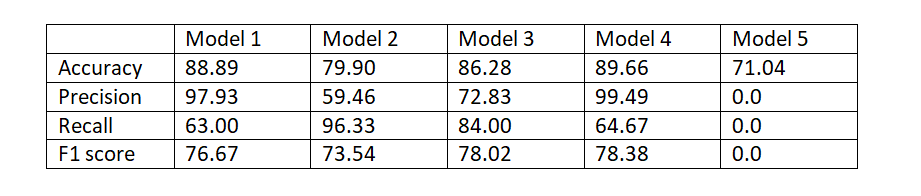

In [69]:
from IPython.display import Image
Image(filename="val_comparison.png")

c). Model 4 is a better model to use because it has a better accuracy and precision. Precision can be seen as a measure of quality, while recall as a measure of quantity. Higher precision means that the model returns more relevant results than irrelevant ones.

#### Task 5

a). The evaluation of Model 1 using test set: Cell 18 to Cell 19

The evaluation of Model 2 using test set: Cell 27 to Cell 28

The evaluation of Model 3 using test set: Cell 36 to Cell 37

The evaluation of Model 4 using test set: Cell 44 to Cell 45

The evaluation of Model 5 using test set: Cell 50 to Cell 51

b). Model 4 is a still better model to use because it still has a better accuracy and precision. Precision can be seen as a measure of quality. Higher precision means that the model returns more relevant results than irrelevant ones.

#### Task 6

Implementation to improve the performance of model 4 is in Cell 54 to Cell 66. The evaluation metrics for both validation and test set are in  Cell 63 - 66. We use bigram as features and removed the 100 most frequent words from the dataset. We can see that the improved model has a better accuarcy, precision, recall, and f1 score. This makes better than all the models.